In [3]:
!python --version

Python 3.11.11


In [4]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-59adaef2-05b1-f791-de79-3d2ed007bbe6)


In [5]:
import tensorflow as tf
print(tf.__version__)
import tf_keras as keras
import matplotlib.pyplot as plt

2.18.0


# Helper Functions

In [6]:
# Plot the validation and training data separately
def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.

  Args:
    history: TensorFlow model History object (see: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/History)
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend()

def compare_histories(original_history, new_history, initial_epochs=5):
  """
  Compares two TensorFlow model History objects.

  Args:
    original_history: History object from original model (before new_history)
    new_history: History object from continued model training (after original_history)
    initial_epochs: Number of epochs in original_history (new_history plot starts from here)
  """

  # Get original history measurements
  acc = original_history.history["accuracy"]
  loss = original_history.history["loss"]

  val_acc = original_history.history["val_accuracy"]
  val_loss = original_history.history["val_loss"]

  # Combine original history with new history
  total_acc = acc + new_history.history["accuracy"]
  total_loss = loss + new_history.history["loss"]

  total_val_acc = val_acc + new_history.history["val_accuracy"]
  total_val_loss = val_loss + new_history.history["val_loss"]

  # Make plots
  plt.figure(figsize=(8, 8))

  plt.subplot(2, 1, 1)
  plt.plot(total_acc, label='Training Accuracy')
  plt.plot(total_val_acc, label='Validation Accuracy')
  plt.plot([initial_epochs, initial_epochs],
              plt.ylim(), label='Start Fine Tuning') # reshift plot around epochs
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')

  plt.subplot(2, 1, 2)
  plt.plot(total_loss, label='Training Loss')
  plt.plot(total_val_loss, label='Validation Loss')
  plt.plot([initial_epochs, initial_epochs], plt.ylim(), label='Start Fine Tuning') # reshift plot around epochs
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.xlabel('epoch')
  plt.show()

## Callbacks

In [7]:
# Tensorboard callback
import datetime

def create_tensorboard_callback(dir_name, experiment_name):
  """
  Creates a TensorBoard callback instance to store log files.

  Stores log files with the filepath:
    "dir_name/experiment_name/current_datetime/"

  Args:
    dir_name: target directory to store TensorBoard log files
    experiment_name: name of experiment directory (e.g. efficientnet_model_1)
  """
  log_dir = dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  tensorboard_callback = keras.callbacks.TensorBoard(
      log_dir=log_dir
  )
  print(f"Saving TensorBoard log files to: {log_dir}")
  return tensorboard_callback

# Checkpoint callback
# checkpoint_path = "model_checkpoints/cp.ckpt"
# model_checkpoint_callback = keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
#                                                             monitor="val_loss",
#                                                             save_best_only=True,
#                                                             save_weights_only=True,
#                                                             verbose=0)

def model_checkpoint_callback(exp_name):

  checkpoint_callback = keras.callbacks.ModelCheckpoint(filepath="model_checkpoints/"+exp_name+"/cp.ckpt",
                                         monitor="val_loss",
                                         save_best_only=True,
                                         save_weights_only=True,
                                         verbose=0)

  return checkpoint_callback
# EarlyStopping callback
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # Monitor validation loss
    patience=5,          # Stop training after 5 epochs with no improvement
    restore_best_weights=True  # Restore the best weights at the end of training
)

# Data Loading

In [8]:
import tensorflow_datasets as tfds

In [9]:
ds_list = tfds.list_builders()
print('colorectal_histology' in ds_list)

True


In [10]:
builder = tfds.builder("colorectal_histology")
print(builder.info.splits)

{'train': <SplitInfo num_examples=5000, num_shards=2>}


In [11]:
(train_ds, val_ds, test_ds), ds_info = tfds.load(name='colorectal_histology',
                                             split=['train[:75%]', 'train[75%:95%]', 'train[95%:]'],
                                             shuffle_files=True,
                                             as_supervised=True,
                                             with_info=True)

train_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(150, 150, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [12]:
class_names = ds_info.features['label'].names
num_classes = len(class_names)
class_names

['tumor',
 'stroma',
 'complex',
 'lympho',
 'debris',
 'mucosa',
 'adipose',
 'empty']

## Checking data imbalance

In [13]:
from collections import Counter

class_counts = Counter()

for _, label in train_ds:
    class_counts[int(label.numpy())] += 1

print("Class Distribution:", class_counts)

Class Distribution: Counter({6: 476, 4: 475, 0: 474, 3: 474, 7: 465, 5: 464, 1: 464, 2: 458})


In [14]:
total_samples = sum(class_counts.values())

# Calculate class weights
class_weights = {
    class_id: total_samples / (len(class_counts) * count)
    for class_id, count in class_counts.items()
}

print("Class Weights:", (class_weights))

Class Weights: {4: 0.9868421052631579, 5: 1.0102370689655173, 0: 0.9889240506329114, 6: 0.9847689075630253, 1: 1.0102370689655173, 3: 0.9889240506329114, 7: 1.0080645161290323, 2: 1.023471615720524}


# Data Preprocessing

In [15]:
def preprocess_img(image, label, img_shape=224):
  """
  Converts image datatype from 'uint8' -> 'float32' and reshapes
  image to [img_shape, img_shape, colour_channels]
  """
  image = tf.image.resize(image, [img_shape, img_shape])
  label = tf.cast(label, tf.float32)
  return tf.cast(image, tf.float32), label

In [16]:
train_ds = train_ds.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE)

train_ds = train_ds.shuffle(buffer_size=1000).batch(batch_size=32).prefetch(buffer_size=tf.data.AUTOTUNE)

val_ds= val_ds.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE).batch(32).prefetch(buffer_size=tf.data.AUTOTUNE)

test_ds = test_ds.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE).batch(32).prefetch(buffer_size=tf.data.AUTOTUNE)

train_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.float32, name=None))>

# Setting up Mixed Precision Training

In [17]:
from tf_keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')
mixed_precision.global_policy()

<Policy "mixed_float16">

In [18]:
from tf_keras.layers.experimental import preprocessing

data_augmentation_resnet = keras.Sequential([
    preprocessing.RandomRotation(0.2),  # Random rotation from -20 to 20 degrees
    preprocessing.RandomFlip("horizontal"),  # Random horizontal flip
    preprocessing.RandomZoom(0.2),  # Random zoom (20% zoom)
    preprocessing.RandomTranslation(height_factor=0.1, width_factor=0.1),  # Random translation
    preprocessing.RandomContrast(0.2),  # Random contrast adjustment
    preprocessing.Rescaling(1./255),  # You can adjust the input shape as needed
], name='data_augmentation')

In [19]:
data_augmentation_efficientnet = keras.Sequential([
    preprocessing.RandomRotation(0.2),  # Random rotation from -20 to 20 degrees
    preprocessing.RandomFlip("horizontal"),  # Random horizontal flip
    preprocessing.RandomZoom(0.2),  # Random zoom (20% zoom)
    preprocessing.RandomTranslation(0.1, 0.1),  # Random translation
    preprocessing.RandomContrast(0.2),  # Random contrast adjustment
], name='data_augmentation')

# Model Training


1.   Baseline model: Simple CNN
2.   Model 1:        ResNet101V2
3.   Model 2:        EfficientNetV2B3
4.   Model 3:        LR scheduler and 10 unfreezed layers
5.   Model 4:        Regularization
6.   Model 5:        30 epochs (each FE and FT) with EarlyStopping

In [20]:
from tf_keras import layers
from tf_keras.models import Sequential

efficientnetv2b3 = keras.applications.efficientnet_v2.EfficientNetV2B3(weights='imagenet', include_top=False)
resnet101v2 = keras.applications.resnet_v2.ResNet101V2(weights='imagenet', include_top=False)

## 1.   Baseline model: Simple CNN

In [21]:
input_shape = (224, 224, 3)
baseline_model = Sequential([
                             layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
                             layers.MaxPooling2D(2, 2),
                             layers.Conv2D(64, (3, 3), activation='relu'),
                             layers.MaxPooling2D(2, 2),
                             layers.Flatten(),
                             layers.Dense(128, activation='relu'),
                             layers.Dense(len(class_names), activation='softmax')
])

In [22]:
baseline_model.compile(loss='sparse_categorical_crossentropy',
                       optimizer=keras.optimizers.Adam(),
                       metrics=['accuracy'])

In [23]:
history_baseline = baseline_model.fit(train_ds,
                                         epochs=5,
                                         steps_per_epoch=len(train_ds),
                                         validation_data=val_ds,
                                         validation_steps=len(val_ds),
                                         callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                                experiment_name='efficientnet_baseline')])

Saving TensorBoard log files to: training_logs/efficientnet_baseline/20250201-061743
Epoch 1/5
118/118 [==============================] - 15s 70ms/step - loss: inf - accuracy: 0.2664 - val_loss: 1.7155 - val_accuracy: 0.3550
Epoch 2/5
118/118 [==============================] - 10s 74ms/step - loss: 1.3735 - accuracy: 0.5400 - val_loss: 1.7057 - val_accuracy: 0.3920
Epoch 3/5
118/118 [==============================] - 9s 53ms/step - loss: 0.7781 - accuracy: 0.7715 - val_loss: 1.8656 - val_accuracy: 0.4170
Epoch 4/5
118/118 [==============================] - 7s 52ms/step - loss: 0.8929 - accuracy: 0.7333 - val_loss: 1.8531 - val_accuracy: 0.4170
Epoch 5/5
118/118 [==============================] - 9s 70ms/step - loss: 0.5836 - accuracy: 0.8152 - val_loss: 2.0638 - val_accuracy: 0.4190


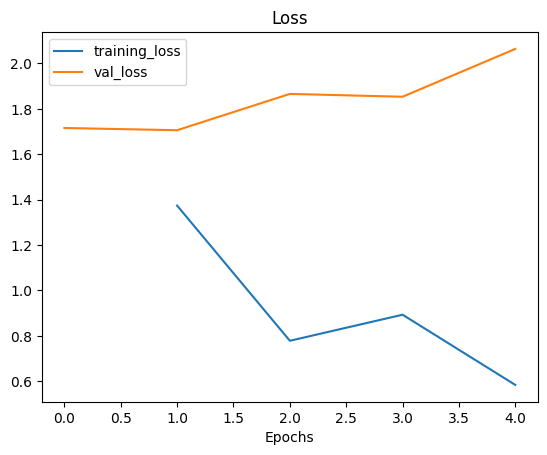

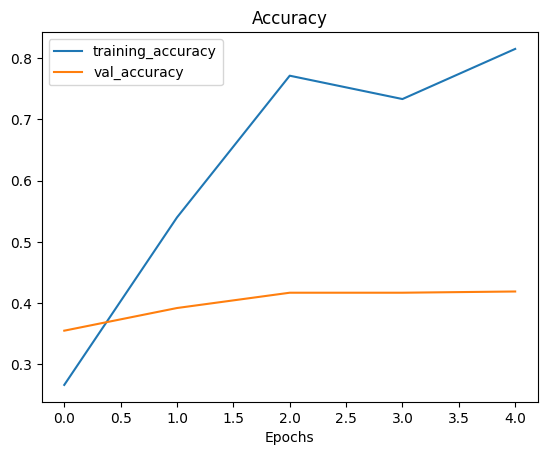

In [24]:
plot_loss_curves(history_baseline)

In [25]:
result_baseline = baseline_model.evaluate(test_ds)
result_baseline

8/8 [==============================] - 1s 148ms/step - loss: 1.8355 - accuracy: 0.4320


[1.8354687690734863, 0.4320000112056732]

## 2.   Model 1:        ResNet101V2

### Feature extraction

In [26]:
exp_name = 'model_1_fe'

In [27]:
resnet101v2.trainable = False

input_shape = (224, 224, 3)
inputs = layers.Input(shape=input_shape, name='input_layer')
x = data_augmentation_resnet(inputs)
x = resnet101v2(inputs, training=False)
x = layers.GlobalAveragePooling2D(name='global_avg_pool')(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation('softmax', dtype=tf.float32, name='softmax_float32')(x)
model_1 = keras.Model(inputs, outputs)

model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet101v2 (Functional)    (None, None, None, 2048   42626560  
                             )                                   
                                                                 
 global_avg_pool (GlobalAve  (None, 2048)              0         
 ragePooling2D)                                                  
                                                                 
 dense_2 (Dense)             (None, 8)                 16392     
                                                                 
 softmax_float32 (Activatio  (None, 8)                 0         
 n)                                                              
                                                             

In [28]:
model_1.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(),
                metrics=['accuracy'])

In [29]:
history_m1_fe = model_1.fit(train_ds,
                            epochs=5,
                            steps_per_epoch=len(train_ds),
                            validation_data=val_ds,
                            validation_steps=len(val_ds),
                            callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                   experiment_name=exp_name),
                                       model_checkpoint_callback(exp_name)])

Saving TensorBoard log files to: training_logs/model_1_fe/20250201-061841
Epoch 1/5
118/118 [==============================] - 24s 124ms/step - loss: 118.4586 - accuracy: 0.3296 - val_loss: 10.6102 - val_accuracy: 0.4670
Epoch 2/5
118/118 [==============================] - 13s 101ms/step - loss: 11.1203 - accuracy: 0.5091 - val_loss: 7.9042 - val_accuracy: 0.5770
Epoch 3/5
118/118 [==============================] - 11s 87ms/step - loss: 8.5702 - accuracy: 0.5536 - val_loss: 18.1959 - val_accuracy: 0.4280
Epoch 4/5
118/118 [==============================] - 12s 82ms/step - loss: 13.5398 - accuracy: 0.5363 - val_loss: 16.1359 - val_accuracy: 0.4840
Epoch 5/5
118/118 [==============================] - 13s 89ms/step - loss: 7.9505 - accuracy: 0.6029 - val_loss: 9.1801 - val_accuracy: 0.5510


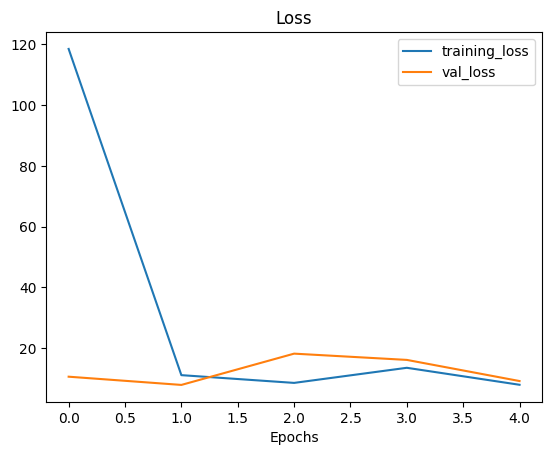

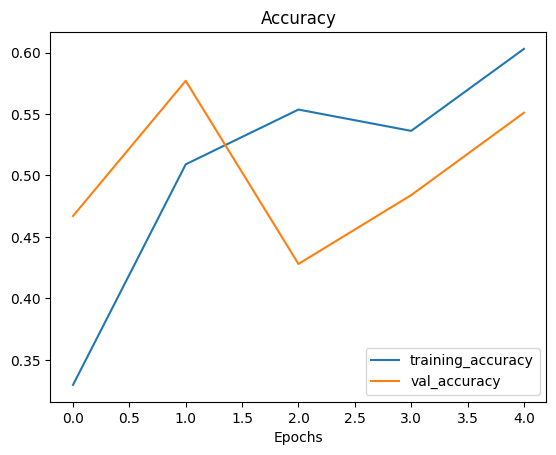

In [30]:
plot_loss_curves(history_m1_fe)

### Fine tuning

In [31]:
model_1.load_weights("model_checkpoints/"+exp_name+"/cp.ckpt")

In [32]:
exp_name = 'model_1_ft'

In [33]:
resnet101v2.trainable = True

for layer in resnet101v2.layers[:-5]:
  layer.trainable = False

model_1.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(learning_rate=1e-4),
                metrics=['accuracy'])

In [34]:
fine_tune_epochs = 10

history_m1_ft = model_1.fit(train_ds,
                            epochs=fine_tune_epochs,
                            steps_per_epoch=len(train_ds),
                            initial_epoch=history_m1_fe.epoch[-1],
                            validation_data=val_ds,
                            callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                   experiment_name=exp_name)])

Saving TensorBoard log files to: training_logs/model_1_ft/20250201-062016
Epoch 5/10
118/118 [==============================] - 22s 112ms/step - loss: 7.5364 - accuracy: 0.5923 - val_loss: 12.2221 - val_accuracy: 0.5180
Epoch 6/10
118/118 [==============================] - 12s 94ms/step - loss: 5.6105 - accuracy: 0.6459 - val_loss: 8.9856 - val_accuracy: 0.5860
Epoch 7/10
118/118 [==============================] - 12s 86ms/step - loss: 5.6126 - accuracy: 0.6429 - val_loss: 6.4834 - val_accuracy: 0.6550
Epoch 8/10
118/118 [==============================] - 13s 97ms/step - loss: 6.0892 - accuracy: 0.6595 - val_loss: 9.0365 - val_accuracy: 0.6030
Epoch 9/10
118/118 [==============================] - 12s 92ms/step - loss: 5.1968 - accuracy: 0.6784 - val_loss: 4.1302 - val_accuracy: 0.7040
Epoch 10/10
118/118 [==============================] - 11s 86ms/step - loss: 3.8032 - accuracy: 0.7133 - val_loss: 7.6897 - val_accuracy: 0.6030


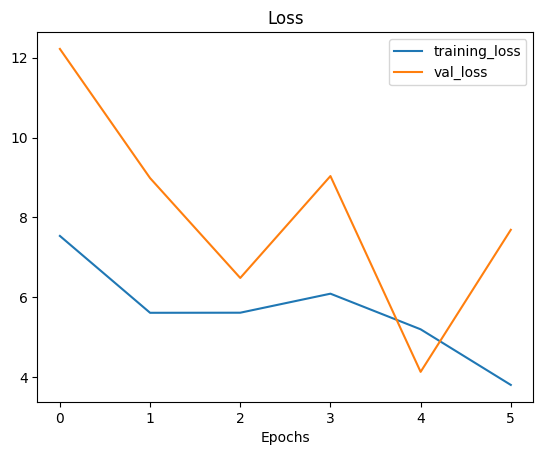

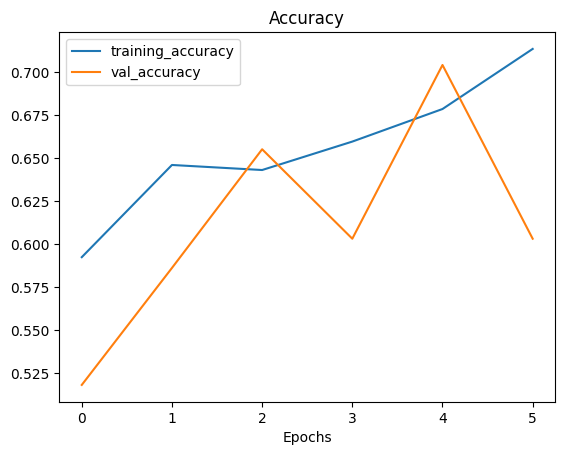

In [35]:
plot_loss_curves(history_m1_ft)

### Evaluation

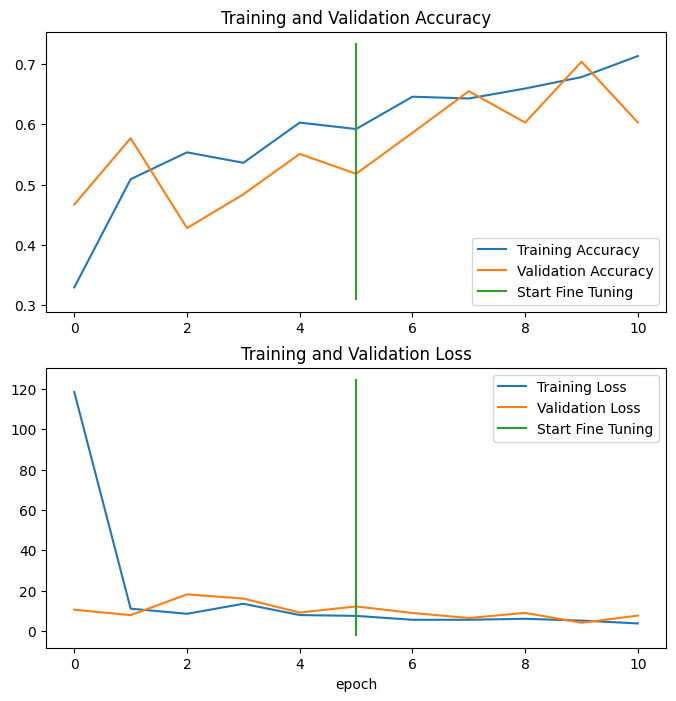

In [36]:
compare_histories(history_m1_fe, history_m1_ft)

In [37]:
result_1 = model_1.evaluate(test_ds)
result_1

8/8 [==============================] - 1s 128ms/step - loss: 8.8130 - accuracy: 0.5840


[8.812994003295898, 0.5839999914169312]

## 3.   Model 2:        EfficientNetV2B3

### Feature extraction

In [38]:
exp_name = 'model_2_fe'

In [39]:
efficientnetv2b3.trainable = False

input_shape = (224, 224, 3)
inputs = layers.Input(shape=input_shape, name='input_layer')
x = data_augmentation_efficientnet(inputs)
x = efficientnetv2b3(inputs, training=False)
x = layers.GlobalAveragePooling2D(name='global_avg_pool')(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation('softmax', dtype=tf.float32, name='softmax_float32')(x)
model_2 = keras.Model(inputs, outputs)

model_2.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_avg_pool (GlobalAve  (None, 1536)              0         
 ragePooling2D)                                                  
                                                                 
 dense_3 (Dense)             (None, 8)                 12296     
                                                                 
 softmax_float32 (Activatio  (None, 8)                 0         
 n)                                                              
                                                           

In [40]:
model_2.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(),
                metrics=['accuracy']
)

In [41]:
history_m2_fe = model_2.fit(train_ds,
                            epochs=5,
                            steps_per_epoch=len(train_ds),
                            validation_data=val_ds,
                            validation_steps=len(val_ds),
                            callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                   experiment_name=exp_name),
                                       model_checkpoint_callback(exp_name)])

Saving TensorBoard log files to: training_logs/model_2_fe/20250201-062213
Epoch 1/5
118/118 [==============================] - 29s 121ms/step - loss: 0.7636 - accuracy: 0.7717 - val_loss: 0.4755 - val_accuracy: 0.8490
Epoch 2/5
118/118 [==============================] - 11s 81ms/step - loss: 0.3975 - accuracy: 0.8771 - val_loss: 0.3751 - val_accuracy: 0.8880
Epoch 3/5
118/118 [==============================] - 11s 87ms/step - loss: 0.3188 - accuracy: 0.9019 - val_loss: 0.3259 - val_accuracy: 0.9040
Epoch 4/5
118/118 [==============================] - 11s 75ms/step - loss: 0.2718 - accuracy: 0.9139 - val_loss: 0.3048 - val_accuracy: 0.9060
Epoch 5/5
118/118 [==============================] - 13s 97ms/step - loss: 0.2445 - accuracy: 0.9256 - val_loss: 0.2955 - val_accuracy: 0.9090


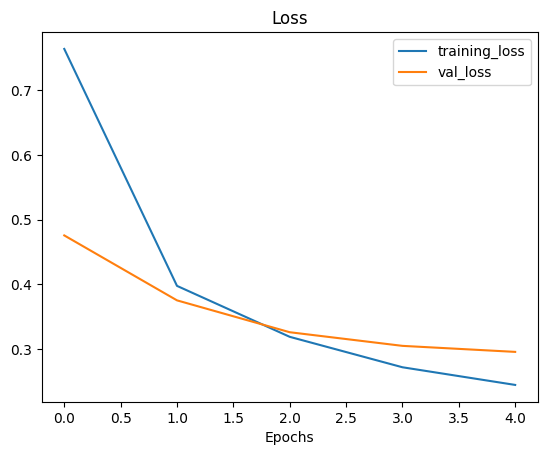

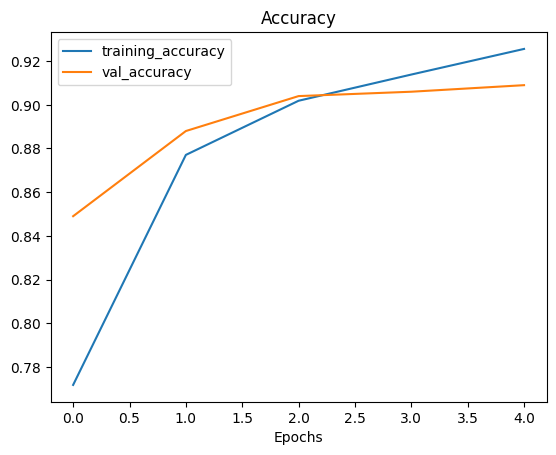

In [42]:
plot_loss_curves(history_m2_fe)

### Fine tuning

In [43]:
model_2.load_weights("model_checkpoints/"+exp_name+"/cp.ckpt")

In [44]:
exp_name = 'model_2_ft'

In [45]:
efficientnetv2b3.trainable = True

for layer in efficientnetv2b3.layers[:-5]:
  layer.trainable = False

model_2.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(learning_rate=1e-4),
                metrics=['accuracy'])

In [46]:
fine_tune_epochs = 10

history_m2_ft = model_2.fit(train_ds,
                            epochs=fine_tune_epochs,
                            steps_per_epoch=len(train_ds),
                            initial_epoch=history_m2_fe.epoch[-1],
                            validation_data=val_ds,
                            callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                   experiment_name=exp_name)])

Saving TensorBoard log files to: training_logs/model_2_ft/20250201-062337
Epoch 5/10
118/118 [==============================] - 26s 104ms/step - loss: 0.2149 - accuracy: 0.9357 - val_loss: 0.2761 - val_accuracy: 0.9080
Epoch 6/10
118/118 [==============================] - 10s 79ms/step - loss: 0.1842 - accuracy: 0.9424 - val_loss: 0.2532 - val_accuracy: 0.9140
Epoch 7/10
118/118 [==============================] - 12s 88ms/step - loss: 0.1599 - accuracy: 0.9531 - val_loss: 0.2610 - val_accuracy: 0.9150
Epoch 8/10
118/118 [==============================] - 11s 81ms/step - loss: 0.1453 - accuracy: 0.9568 - val_loss: 0.2379 - val_accuracy: 0.9140
Epoch 9/10
118/118 [==============================] - 11s 80ms/step - loss: 0.1274 - accuracy: 0.9661 - val_loss: 0.2374 - val_accuracy: 0.9180
Epoch 10/10
118/118 [==============================] - 10s 68ms/step - loss: 0.1176 - accuracy: 0.9696 - val_loss: 0.2293 - val_accuracy: 0.9200


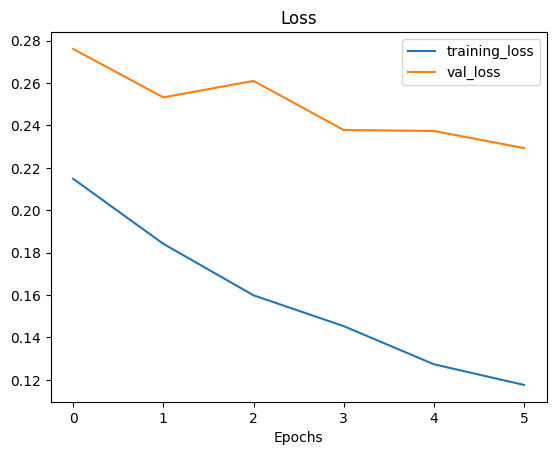

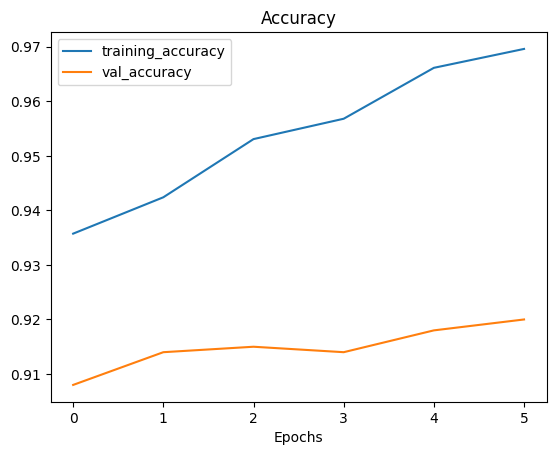

In [47]:
plot_loss_curves(history_m2_ft)

### Evaluation

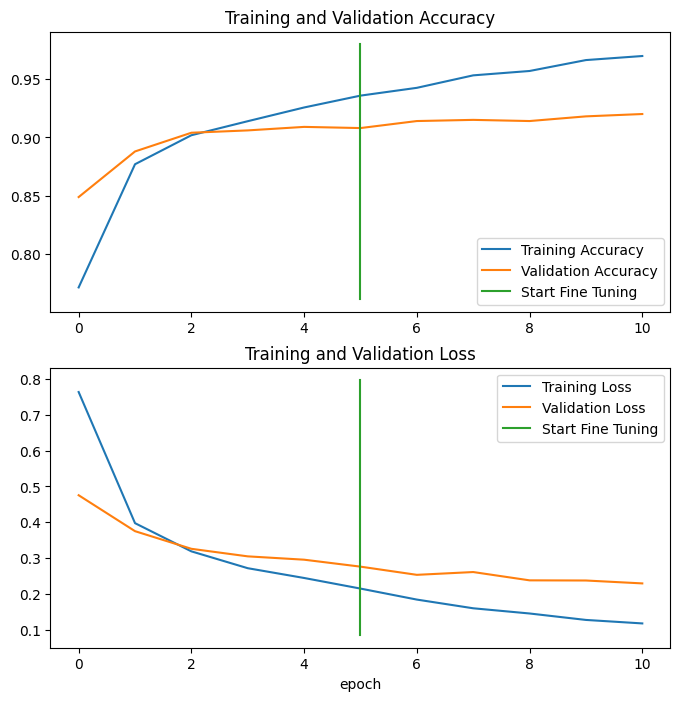

In [48]:
compare_histories(history_m2_fe, history_m2_ft)

In [49]:
result_2 = model_2.evaluate(test_ds)
result_2

8/8 [==============================] - 1s 130ms/step - loss: 0.1524 - accuracy: 0.9480


[0.1524193435907364, 0.9480000138282776]

## 4.   Model 3:        LR scheduler and 10 unfreezed layers

In [50]:
base_model = efficientnetv2b3
data_augmentation = data_augmentation_efficientnet
base_model

### Feature extraction

In [51]:
exp_name = 'model_3_fe'

In [52]:
base_model.trainable = False

input_shape = (224, 224, 3)
inputs = layers.Input(shape=input_shape, name='input_layer')
x = data_augmentation(inputs)
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D(name='global_avg_pool')(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation('softmax', dtype=tf.float32, name='softmax_float32')(x)
model_3 = keras.Model(inputs, outputs)

model_3.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_avg_pool (GlobalAve  (None, 1536)              0         
 ragePooling2D)                                                  
                                                                 
 dense_4 (Dense)             (None, 8)                 12296     
                                                                 
 softmax_float32 (Activatio  (None, 8)                 0         
 n)                                                              
                                                           

In [53]:
lr_scheduler = keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=1e-3,
                                                              decay_steps=10000,
                                                              decay_rate=0.9,
                                                              staircase=False)

model_3.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(learning_rate=lr_scheduler),
                metrics=['accuracy']
)

In [54]:
history_m3_fe = model_3.fit(train_ds,
                            epochs=5,
                            steps_per_epoch=len(train_ds),
                            validation_data=val_ds,
                            validation_steps=len(val_ds),
                            callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                   experiment_name=exp_name),
                                       model_checkpoint_callback(exp_name)])

Saving TensorBoard log files to: training_logs/model_3_fe/20250201-062521
Epoch 1/5
118/118 [==============================] - 27s 113ms/step - loss: 0.6543 - accuracy: 0.7995 - val_loss: 0.3676 - val_accuracy: 0.8920
Epoch 2/5
118/118 [==============================] - 12s 86ms/step - loss: 0.2821 - accuracy: 0.9160 - val_loss: 0.2931 - val_accuracy: 0.9100
Epoch 3/5
118/118 [==============================] - 12s 90ms/step - loss: 0.2107 - accuracy: 0.9405 - val_loss: 0.2587 - val_accuracy: 0.9190
Epoch 4/5
118/118 [==============================] - 10s 76ms/step - loss: 0.1754 - accuracy: 0.9520 - val_loss: 0.2470 - val_accuracy: 0.9250
Epoch 5/5
118/118 [==============================] - 13s 89ms/step - loss: 0.1508 - accuracy: 0.9613 - val_loss: 0.2399 - val_accuracy: 0.9190


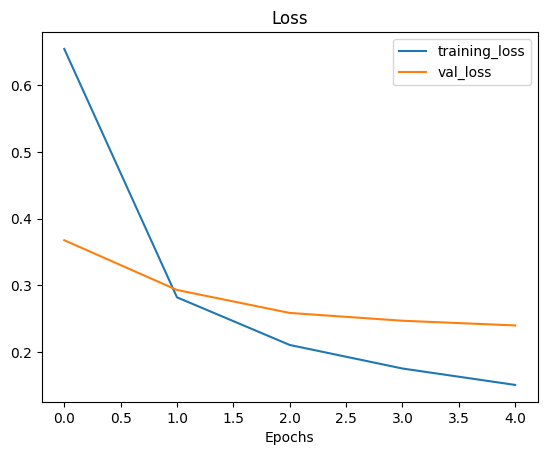

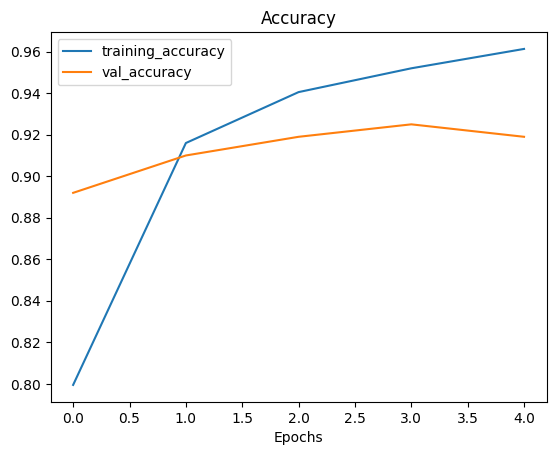

In [55]:
plot_loss_curves(history_m3_fe)

### Fine tuning

In [56]:
model_3.load_weights('model_checkpoints/'+exp_name+'/cp.ckpt')

In [57]:
exp_name = 'model_3_ft'

In [58]:
base_model.trainable = True

for layer in base_model.layers[:-10]:
  layer.trainable = False

fine_tune_lr_scheduler = keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=1e-4,
                                                                     decay_steps=10000,
                                                                     decay_rate=0.9,
                                                                     staircase=False)

model_3.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(learning_rate=fine_tune_lr_scheduler),
                metrics=['accuracy'])

In [59]:
fine_tune_epochs = 10

history_m3_ft = model_3.fit(train_ds,
                            epochs=fine_tune_epochs,
                            steps_per_epoch=len(train_ds),
                            initial_epoch=history_m3_fe.epoch[-1],
                            validation_data=val_ds,
                            callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                   experiment_name=exp_name)])

Saving TensorBoard log files to: training_logs/model_3_ft/20250201-062654
Epoch 5/10
118/118 [==============================] - 31s 113ms/step - loss: 0.1360 - accuracy: 0.9592 - val_loss: 0.2392 - val_accuracy: 0.9200
Epoch 6/10
118/118 [==============================] - 10s 72ms/step - loss: 0.1106 - accuracy: 0.9677 - val_loss: 0.2388 - val_accuracy: 0.9160
Epoch 7/10
118/118 [==============================] - 11s 79ms/step - loss: 0.0960 - accuracy: 0.9749 - val_loss: 0.2350 - val_accuracy: 0.9210
Epoch 8/10
118/118 [==============================] - 11s 78ms/step - loss: 0.0878 - accuracy: 0.9773 - val_loss: 0.2266 - val_accuracy: 0.9200
Epoch 9/10
118/118 [==============================] - 11s 81ms/step - loss: 0.0769 - accuracy: 0.9795 - val_loss: 0.2344 - val_accuracy: 0.9240
Epoch 10/10
118/118 [==============================] - 12s 84ms/step - loss: 0.0632 - accuracy: 0.9843 - val_loss: 0.2465 - val_accuracy: 0.9190


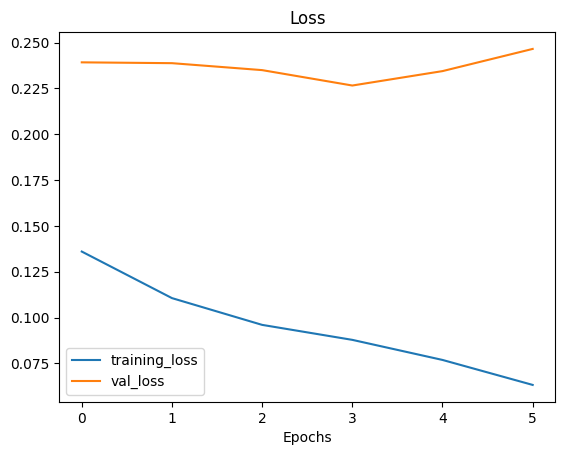

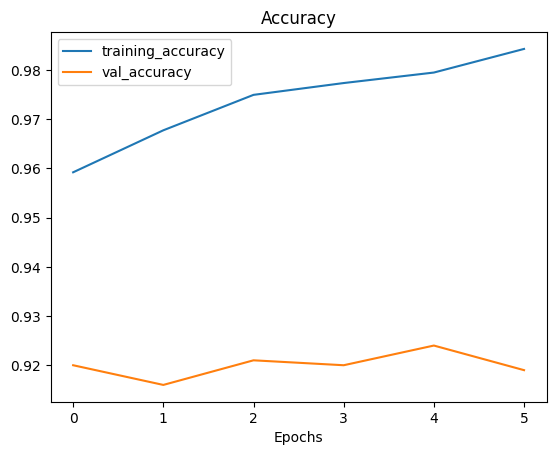

In [60]:
plot_loss_curves(history_m3_ft)

### Evaluation

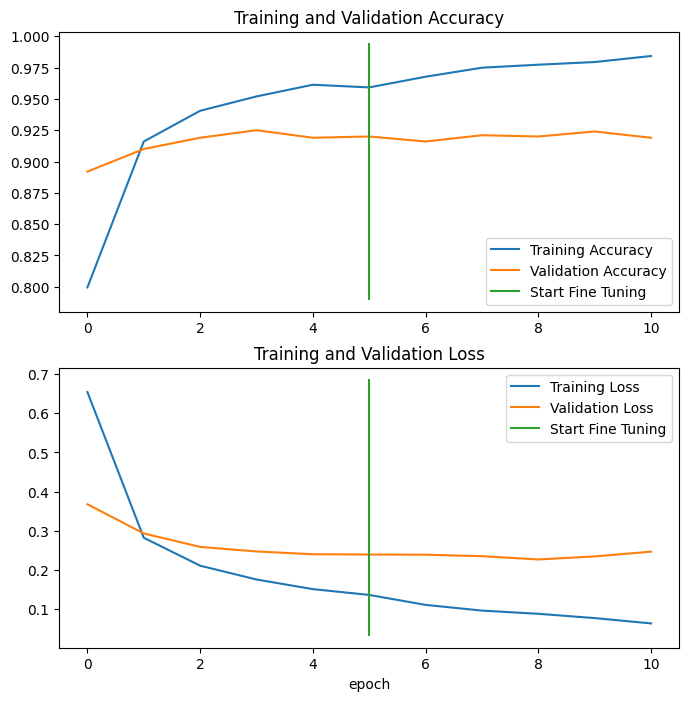

In [61]:
compare_histories(history_m3_fe, history_m3_ft)

In [62]:
result_3 = model_3.evaluate(test_ds)
result_3

8/8 [==============================] - 0s 51ms/step - loss: 0.1649 - accuracy: 0.9400


[0.1649191826581955, 0.9399999976158142]

## Model 4:        Regularization

### Feature extraction

In [63]:
exp_name = 'model_4_fe'

In [64]:
base_model.trainable = False

input_shape = (224, 224, 3)
inputs = layers.Input(shape=input_shape, name='input_layer')
x = data_augmentation(inputs)
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D(name='global_avg_pool')(x)
x = layers.BatchNormalization()(x)
x = layers.Dense(256, activation='relu', kernel_regularizer=keras.regularizers.l2(1e-3))(x)
x = layers.Dropout(0.6)(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation('softmax', dtype=tf.float32, name='softmax_float32')(x)
model_4 = keras.Model(inputs, outputs)

model_4.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_avg_pool (GlobalAve  (None, 1536)              0         
 ragePooling2D)                                                  
                                                                 
 batch_normalization (Batch  (None, 1536)              6144      
 Normalization)                                                  
                                                                 
 dense_5 (Dense)             (None, 256)               393472    
                                                           

In [65]:
lr_scheduler = keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=1e-3,  # Starting learning rate
                                                              decay_steps=10000,          # Steps before applying decay
                                                              decay_rate=0.9,             # Rate of decay
                                                              staircase=False)             # Whether to decay in a step-wise fashion

model_4.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(learning_rate=lr_scheduler),
                metrics=['accuracy'])

In [66]:
history_m4_fe = model_4.fit(train_ds,
                            epochs=5,
                            steps_per_epoch=len(train_ds),
                            validation_data=val_ds,
                            validation_steps=len(val_ds),
                            callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                   experiment_name=exp_name),
                                       model_checkpoint_callback(exp_name)])

Saving TensorBoard log files to: training_logs/model_4_fe/20250201-062854
Epoch 1/5
118/118 [==============================] - 30s 127ms/step - loss: 1.1392 - accuracy: 0.8005 - val_loss: 0.7396 - val_accuracy: 0.8940
Epoch 2/5
118/118 [==============================] - 10s 68ms/step - loss: 0.7878 - accuracy: 0.8864 - val_loss: 0.7643 - val_accuracy: 0.9050
Epoch 3/5
118/118 [==============================] - 11s 87ms/step - loss: 0.6993 - accuracy: 0.9136 - val_loss: 0.6983 - val_accuracy: 0.9170
Epoch 4/5
118/118 [==============================] - 11s 83ms/step - loss: 0.6562 - accuracy: 0.9251 - val_loss: 0.6771 - val_accuracy: 0.9190
Epoch 5/5
118/118 [==============================] - 9s 68ms/step - loss: 0.6042 - accuracy: 0.9333 - val_loss: 0.6792 - val_accuracy: 0.9160


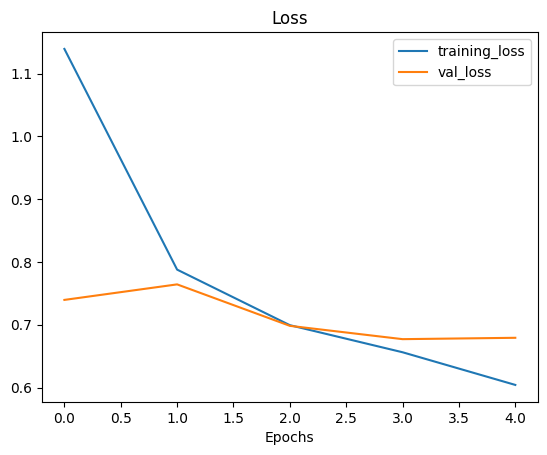

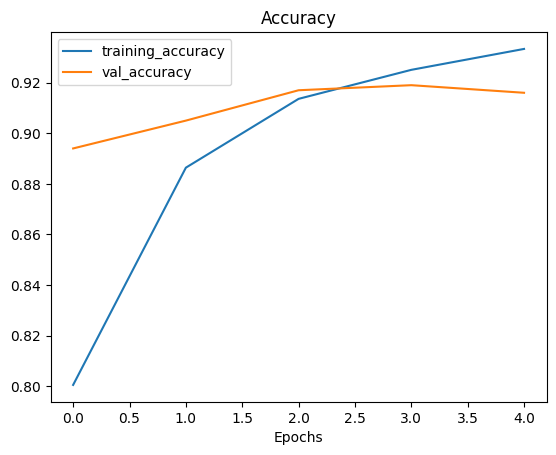

In [67]:
plot_loss_curves(history_m4_fe)

### Fine tuning

In [68]:
model_4.load_weights('model_checkpoints/'+exp_name+'/cp.ckpt')

In [69]:
exp_name = 'model_4_ft'

In [70]:
base_model.trainable = True

for layer in base_model.layers[:-10]:
  layer.trainable = False

fine_tune_lr_scheduler = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-4,  # Smaller learning rate for fine-tuning
    decay_steps=10000,
    decay_rate=0.9
)

model_4.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(learning_rate=fine_tune_lr_scheduler),
                metrics=['accuracy'])

In [71]:
fine_tune_epochs = 10

history_m4_ft = model_4.fit(train_ds,
                            epochs=fine_tune_epochs,
                            steps_per_epoch=len(train_ds),
                            initial_epoch=history_m4_fe.epoch[-1],
                            validation_data=val_ds,
                            callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                   experiment_name=exp_name)])

Saving TensorBoard log files to: training_logs/model_4_ft/20250201-063020
Epoch 5/10
118/118 [==============================] - 30s 107ms/step - loss: 0.5651 - accuracy: 0.9421 - val_loss: 0.6511 - val_accuracy: 0.9230
Epoch 6/10
118/118 [==============================] - 10s 73ms/step - loss: 0.4968 - accuracy: 0.9624 - val_loss: 0.6220 - val_accuracy: 0.9310
Epoch 7/10
118/118 [==============================] - 11s 81ms/step - loss: 0.4906 - accuracy: 0.9637 - val_loss: 0.6328 - val_accuracy: 0.9290
Epoch 8/10
118/118 [==============================] - 12s 88ms/step - loss: 0.4578 - accuracy: 0.9749 - val_loss: 0.6358 - val_accuracy: 0.9270
Epoch 9/10
118/118 [==============================] - 12s 94ms/step - loss: 0.4470 - accuracy: 0.9736 - val_loss: 0.6191 - val_accuracy: 0.9260
Epoch 10/10
118/118 [==============================] - 11s 80ms/step - loss: 0.4269 - accuracy: 0.9805 - val_loss: 0.6320 - val_accuracy: 0.9290


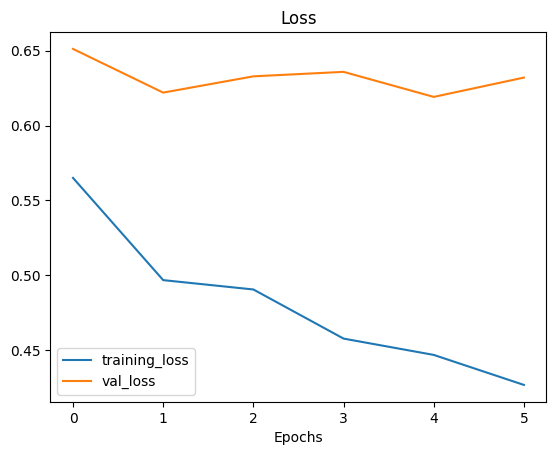

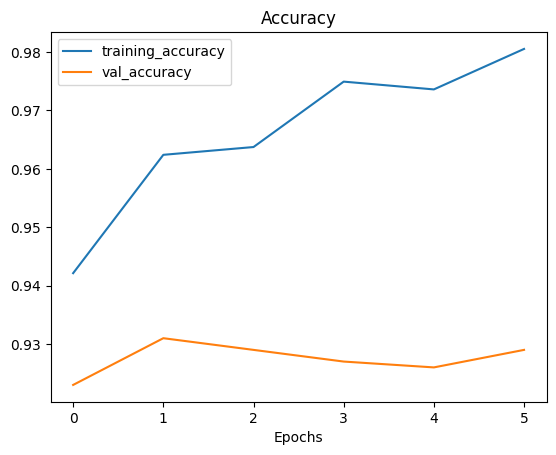

In [72]:
plot_loss_curves(history_m4_ft)

### Evaluation

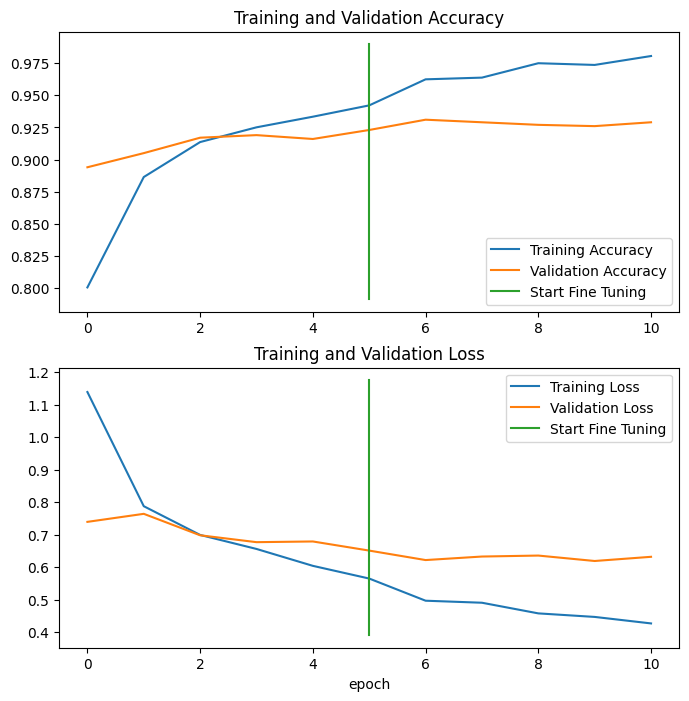

In [73]:
compare_histories(history_m4_fe, history_m4_ft)

In [74]:
result_4 = model_4.evaluate(test_ds)
result_4

8/8 [==============================] - 0s 51ms/step - loss: 0.5482 - accuracy: 0.9440


[0.5481536984443665, 0.9440000057220459]

## Model 5:        30 epochs (each FE and FT) with EarlyStopping

### Feature extraction

In [75]:
exp_name = 'model_5_fe'

In [76]:
base_model.trainable = False

input_shape = (224, 224, 3)
inputs = layers.Input(shape=input_shape, name='input_layer')
x = data_augmentation(inputs)
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D(name='global_avg_pool')(x)
x = layers.BatchNormalization()(x)
x = layers.Dense(256, activation='relu', kernel_regularizer=keras.regularizers.l2(1e-3))(x)
x = layers.Dropout(0.6)(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation('softmax', dtype=tf.float32, name='softmax_float32')(x)
model_5 = keras.Model(inputs, outputs)

model_5.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_avg_pool (GlobalAve  (None, 1536)              0         
 ragePooling2D)                                                  
                                                                 
 batch_normalization_1 (Bat  (None, 1536)              6144      
 chNormalization)                                                
                                                                 
 dense_7 (Dense)             (None, 256)               393472    
                                                           

In [77]:
lr_scheduler = keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=1e-3,  # Starting learning rate
                                                              decay_steps=10000,          # Steps before applying decay
                                                              decay_rate=0.9,             # Rate of decay
                                                              staircase=False)             # Whether to decay in a step-wise fashion

model_5.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(learning_rate=lr_scheduler),
                metrics=['accuracy'])

In [78]:
history_m5_fe = model_5.fit(train_ds,
                            epochs=30,
                            steps_per_epoch=len(train_ds),
                            validation_data=val_ds,
                            validation_steps=len(val_ds),
                            callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                   experiment_name=exp_name),
                                       model_checkpoint_callback(exp_name),
                                       early_stopping])

Saving TensorBoard log files to: training_logs/model_5_fe/20250201-063220
Epoch 1/30
118/118 [==============================] - 29s 133ms/step - loss: 0.9724 - accuracy: 0.8397 - val_loss: 0.7108 - val_accuracy: 0.9140
Epoch 2/30
118/118 [==============================] - 12s 90ms/step - loss: 0.6158 - accuracy: 0.9376 - val_loss: 0.6622 - val_accuracy: 0.9300
Epoch 3/30
118/118 [==============================] - 10s 78ms/step - loss: 0.5576 - accuracy: 0.9528 - val_loss: 0.6720 - val_accuracy: 0.9280
Epoch 4/30
118/118 [==============================] - 12s 95ms/step - loss: 0.5024 - accuracy: 0.9653 - val_loss: 0.6825 - val_accuracy: 0.9190
Epoch 5/30
118/118 [==============================] - 10s 78ms/step - loss: 0.4891 - accuracy: 0.9635 - val_loss: 0.7242 - val_accuracy: 0.9160
Epoch 6/30
118/118 [==============================] - 11s 76ms/step - loss: 0.4648 - accuracy: 0.9693 - val_loss: 0.6883 - val_accuracy: 0.9230
Epoch 7/30
118/118 [==============================] - 12s 92m

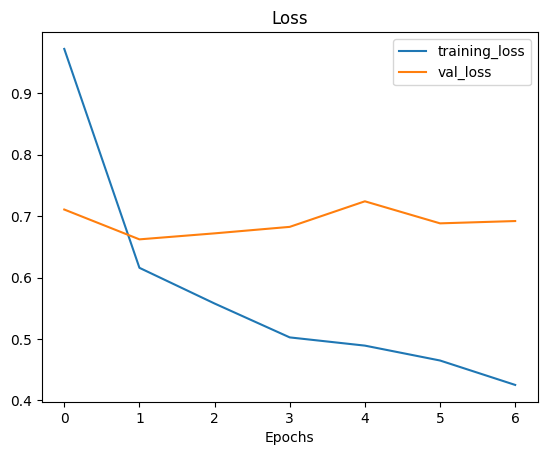

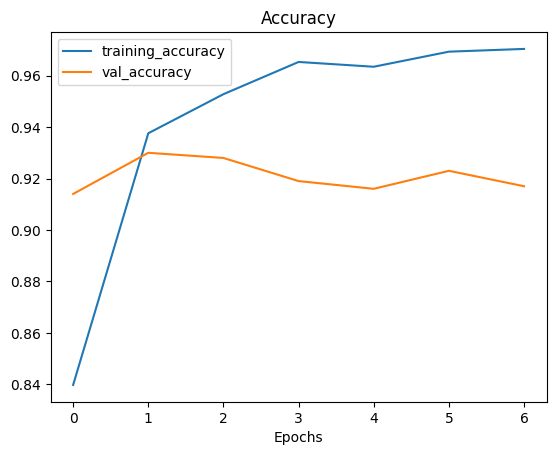

In [79]:
plot_loss_curves(history_m5_fe)

### Fine tuning

In [80]:
model_5.load_weights('model_checkpoints/'+exp_name+'/cp.ckpt')

In [81]:
exp_name = 'model_5_ft'

In [82]:
base_model.trainable = True

for layer in base_model.layers[:-10]:
  layer.trainable = False

fine_tune_lr_scheduler = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-4,  # Smaller learning rate for fine-tuning
    decay_steps=10000,
    decay_rate=0.9
)

model_5.compile(loss='sparse_categorical_crossentropy',
                optimizer=keras.optimizers.Adam(learning_rate=fine_tune_lr_scheduler),
                metrics=['accuracy'])

In [83]:
fine_tune_epochs = 60

history_m5_ft = model_5.fit(train_ds,
                            epochs=fine_tune_epochs,
                            steps_per_epoch=len(train_ds),
                            initial_epoch=history_m5_fe.epoch[-1],
                            validation_data=val_ds,
                            callbacks=[create_tensorboard_callback(dir_name='training_logs',
                                                                   experiment_name=exp_name),
                                       early_stopping])

Saving TensorBoard log files to: training_logs/model_5_ft/20250201-063431
Epoch 7/60
118/118 [==============================] - 29s 117ms/step - loss: 0.5336 - accuracy: 0.9624 - val_loss: 0.6478 - val_accuracy: 0.9230
Epoch 8/60
118/118 [==============================] - 11s 87ms/step - loss: 0.5024 - accuracy: 0.9688 - val_loss: 0.6615 - val_accuracy: 0.9240
Epoch 9/60
118/118 [==============================] - 9s 70ms/step - loss: 0.4663 - accuracy: 0.9835 - val_loss: 0.6674 - val_accuracy: 0.9280
Epoch 10/60
118/118 [==============================] - 13s 87ms/step - loss: 0.4557 - accuracy: 0.9821 - val_loss: 0.6766 - val_accuracy: 0.9290
Epoch 11/60
118/118 [==============================] - 11s 85ms/step - loss: 0.4434 - accuracy: 0.9837 - val_loss: 0.6864 - val_accuracy: 0.9270
Epoch 12/60
118/118 [==============================] - 10s 70ms/step - loss: 0.4305 - accuracy: 0.9877 - val_loss: 0.6576 - val_accuracy: 0.9220


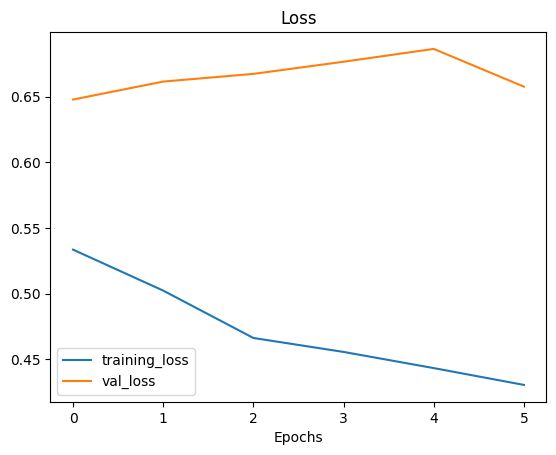

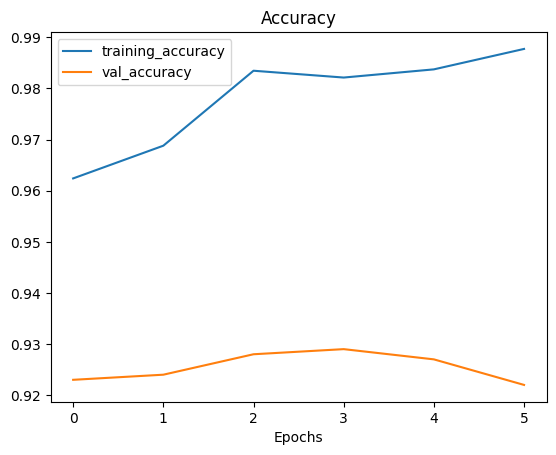

In [84]:
plot_loss_curves(history_m5_ft)

### Evaluation

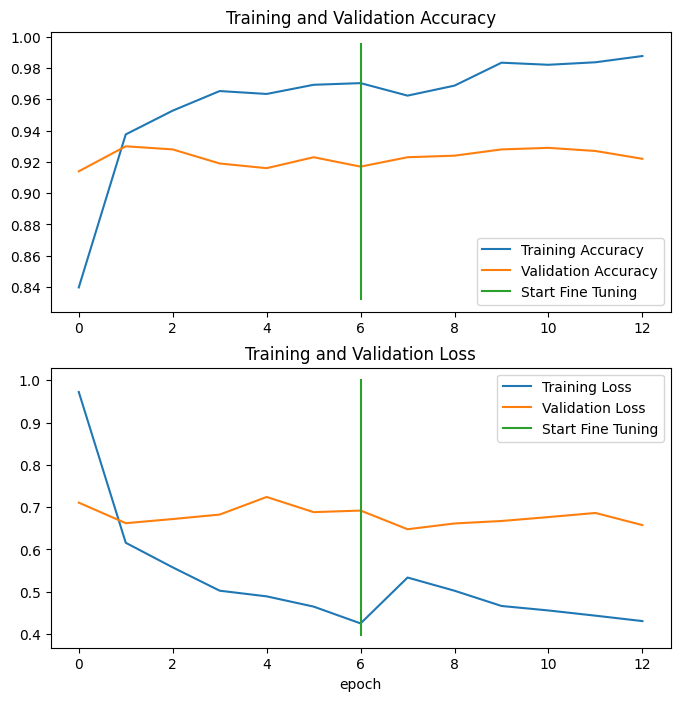

In [85]:
compare_histories(history_m5_fe, history_m5_ft, initial_epochs=history_m5_fe.epoch[-1])

In [86]:
result_5 = model_5.evaluate(test_ds)
result_5

8/8 [==============================] - 0s 44ms/step - loss: 0.5859 - accuracy: 0.9360


[0.58591228723526, 0.9359999895095825]

## Comparison

In [87]:
%load_ext tensorboard

In [88]:
%tensorboard --logdir training_logs

Reusing TensorBoard on port 6006 (pid 21634), started 1:17:00 ago. (Use '!kill 21634' to kill it.)

<IPython.core.display.Javascript object>

In [89]:
import pandas as pd

models = {
    'baseline_model': baseline_model,
    'model_1': model_1,
    'model_2': model_2,
    'model_3': model_3,
    'model_4': model_4,
    'model_5': model_5,
}

results = pd.DataFrame([result_baseline, result_1, result_2, result_3, result_4, result_5], columns=['Loss', 'Accuracy'], index=['baseline_model', 'model_1', 'model_2', 'model_3', 'model_4', 'model_5'])
results

,Loss,Accuracy
baseline_model,1.835469,0.432
model_1,8.812994,0.584
model_2,0.152419,0.948
model_3,0.164919,0.940
model_4,0.548154,0.944
model_5,0.585912,0.936


In [90]:
best_accuracy_index = results['Accuracy'].argmax()  # Get the index of the best accuracy
best_model_key = list(models.keys())[best_accuracy_index]
best_model = models[best_model_key]

print(f'Best model: {best_model_key}')
print(f'Loss:{results.loc[best_model_key, "Loss"]}')
print(f'Accuracy:{results.loc[best_model_key, "Accuracy"]}')

Best model: model_2
Loss:0.1524193435907364
Accuracy:0.9480000138282776


# Visualizing prediction

In [91]:
predictions = best_model.predict(test_ds)
predictions[0]

8/8 [==============================] - 5s 53ms/step


array([1.1971903e-05, 1.9168450e-05, 1.7759926e-06, 5.6440922e-06,
       2.5668327e-05, 7.9117632e-07, 2.8007450e-03, 9.9713421e-01],
      dtype=float32)

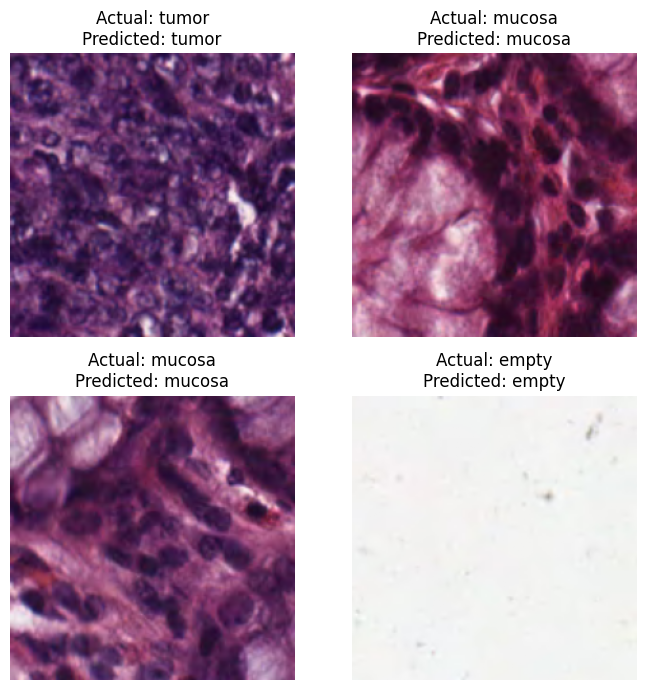

In [92]:
# Create a figure with 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(7, 7))

# Ensure the dataset is properly shuffled before selecting images
random_sample = list(test_ds.unbatch().shuffle(buffer_size=1000).take(4))

# Loop through the selected images and labels
for i, (image, label) in enumerate(random_sample):

    # Ensure proper shape for prediction
    prediction = best_model.predict(tf.expand_dims(image, axis=0), verbose=0)

    # Ensure proper processing of softmax output
    predicted_class_index = tf.argmax(prediction[0]).numpy()
    predicted_class = class_names[predicted_class_index]

    image = image / 255.0  # Normalize image

    ax = axes[i // 2, i % 2]  # Correct subplot indexing
    ax.imshow(image.numpy())
    ax.set_title(f"Actual: {class_names[int(label.numpy())]}\nPredicted: {predicted_class}")
    ax.axis('off')

plt.tight_layout()
plt.show()

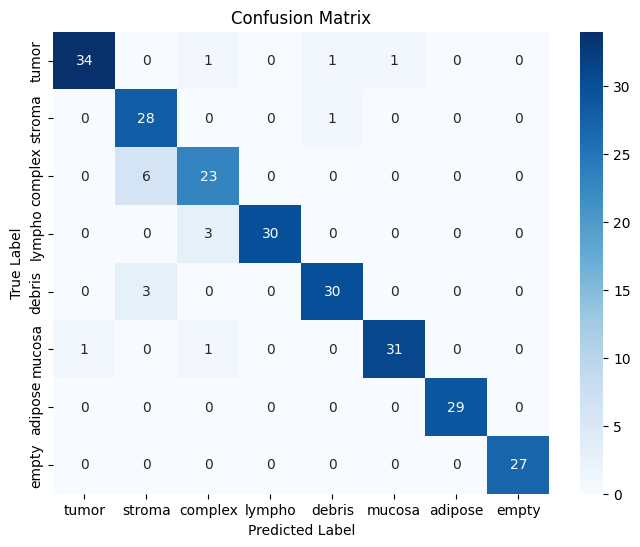

              precision    recall  f1-score   support

       tumor       0.97      0.92      0.94        37
      stroma       0.76      0.97      0.85        29
     complex       0.82      0.79      0.81        29
      lympho       1.00      0.91      0.95        33
      debris       0.94      0.91      0.92        33
      mucosa       0.97      0.94      0.95        33
     adipose       1.00      1.00      1.00        29
       empty       1.00      1.00      1.00        27

    accuracy                           0.93       250
   macro avg       0.93      0.93      0.93       250
weighted avg       0.93      0.93      0.93       250



In [93]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

y_true = []
y_pred = []

# Iterate through test dataset
for image, label in test_ds.unbatch():  # Adjust number of samples if needed
    prediction = best_model.predict(tf.expand_dims(image, axis=0), verbose=0)

    predicted_class_index = tf.argmax(prediction[0]).numpy()

    y_true.append(label.numpy())  # True label
    y_pred.append(predicted_class_index)  # Predicted label

# Convert to NumPy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

print(classification_report(y_true, y_pred, target_names=class_names))

# Saving the best model

In [94]:
best_model.save('colorectal_histology_cv.h5')

/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [95]:
best_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_avg_pool (GlobalAve  (None, 1536)              0         
 ragePooling2D)                                                  
                                                                 
 dense_3 (Dense)             (None, 8)                 12296     
                                                                 
 softmax_float32 (Activatio  (None, 8)                 0         
 n)                                                              
                                                           